# Train Model



## Installation

In [3]:
!pip install -U --pre tensorflow=="2.2.0"

     |████████████████████████████████| 516.2MB 27kB/s 
     |████████████████████████████████| 460kB 49.8MB/s 
     |████████████████████████████████| 3.0MB 45.7MB/s 
  Found existing installation: tensorflow-estimator 2.4.0
    Uninstalling tensorflow-estimator-2.4.0:
      Successfully uninstalled tensorflow-estimator-2.4.0
  Found existing installation: tensorboard 2.4.1
    Uninstalling tensorboard-2.4.1:
      Successfully uninstalled tensorboard-2.4.1
  Found existing installation: tensorflow 2.4.1
    Uninstalling tensorflow-2.4.1:
      Successfully uninstalled tensorflow-2.4.1


In [5]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2406, done.
remote: Counting objects: 100% (2406/2406), done.
remote: Compressing objects: 100% (2012/2012), done.
remote: Total 2406 (delta 572), reused 1380 (delta 366), pack-reused 0
Receiving objects: 100% (2406/2406), 30.78 MiB | 35.22 MiB/s, done.
Resolving deltas: 100% (572/572), done.


In [6]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1618454 sha256=a012c86bb9dd79278943d07759da3f15282e0e90f574f6c5441d2f560314bc5b
  Stored in directory: /tmp/pip-ephem-wheel-cache-1snkxnl2/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
  Created wheel for avro-python3: filename=avro_python3-1.10.1-cp36-none-any.whl size=43734 sha256=430002a780afcb9e8653dcd7ea1ca25c6deffef284d6c3bccbd86a5a9f2af81b
  Stored in directory: /root/.cache/pip/wheels/65/fe/90/20d6d6d97223d80d20cb390be636619c536edab5658c12bdba
  Created wheel for hdfs: filename=hdfs-2.5.8-cp36-none-any.whl size=33213 sha256=41f66972a3ad05d34e0a3ee51beaa0a038b1824eee1f7ae6cc92e72d3c6c46a8
  Stored in directory: /root/.cache/pip/wheels/fe/a7/05/23e3699975fc20f8a30e00ac1e515ab8c61168e982abe4ce70
  Created wheel for dill: filename=dill-0.3.1.1-cp36-none-any.whl size=78533 sha256=c65270b870e011a135ecfa017a51f18f9888785d23d1e23f3bfe72372d

ERROR: multiprocess 0.70.11.1 has requirement dill>=0.3.3, but you'll have dill 0.3.1.1 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.25.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: apache-beam 2.27.0 has requirement avro-python3!=1.9.2,<1.10.0,>=1.8.1, but you'll have avro-python3 1.10.1 which is incompatible.


In [7]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2021-02-11 09:15:54.321891: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2021-02-11 09:15:54.321932: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2021-02-11 09:15:57.836583: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-02-11 09:15:57.838244: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-02-11 09:15:57.890501: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA 

## Prepare data

In [1]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
# drive.flush_and_unmount()

Mounted at /content/gdrive


In [10]:
!ls /content/gdrive/MyDrive/saved_model_phone_use/
train_record_path = '/content/gdrive/MyDrive/saved_model_phone_use/train.record'
test_record_path = '/content/gdrive/MyDrive/saved_model_phone_use/test.record'
labelmap_path = '/content/gdrive/MyDrive/models/driver/label_map.pbtxt'

label_map.pbtxt  test.record  train.record


In [ ]:
with open('label_map.pbtxt', 'a') as the_file:
    the_file.write("item {\n    id: 1\n    name: 'no_phone'\n}\nitem {\n    id: 2\n    name: 'left_ear'\n}\nitem {\n    id: 3\n    name: 'right_ear'\n}")

In [ ]:
labelmap_path = '/content/label_map.pbtxt'

In [ ]:
!ls '/content/gdrive/MyDrive/'

 20000108012941564_1_864W_1_50.plate.jpeg
 20000108012941985_1_864W_1_51.plate.jpeg
 20000108012942336_1_864W_1_52.plate.jpeg
 20000108012942757_1_864W_1_53.plate.jpeg
 20000108012943055_1_864W_1_54.plate.jpeg
 20000108012950696_1_5DMW_1_75.plate.jpeg
 20000108012951180_1_5DMW_1_76.plate.jpeg
 20000108012951305_1_5DMW_1_77.plate.jpeg
 20000108012951775_1_5DMW_1_78.plate.jpeg
 20000108012952136_1_5DMW_1_79.plate.jpeg
 20000108013012735_1_649W_1_136.plate.jpeg
 20000108013013165_1_649W_1_137.plate.jpeg
 20000108013013473_1_649W_1_138.plate.jpeg
 20000108013013886_1_649W_1_139.plate.jpeg
 20000108013014254_1_649W_1_140.plate.jpeg
 Aanvraagformulier-statuut-student-zelfstandige.gdoc
 Aanvraagformulier-statuut-student-zelfstandige.pdf
 ANPR-FOTOS
'Facturen 2020'
 Huji
'IMG_1571 (1).MOV'
 IMG_1571.MOV
'Interview questions .gdoc'
 saved_model_driver
'saved_model_driver (1)'
'saved_model_driver (2)'
 saved_model_phone_use
'ZITCO Administratie 2020'
'zitco_logo_links (1).png'
 zitco_logo_links.

## Configuring training

In [ ]:
batch_size = 8
num_steps = 900
num_eval_steps = 100

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
!tar -xf efficientdet_d0_coco17_tpu-32.tar.gz

--2021-01-08 10:53:53--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.8.16, 2607:f8b0:4004:803::2010
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.8.16|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  --.-KB/s    in 0.1s    

2021-01-08 10:53:53 (229 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [ ]:
fine_tune_checkpoint = 'efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'

In [ ]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config

base_config_path = 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config'

--2021-01-08 10:53:54--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0s      

2021-01-08 10:53:54 (66.7 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’ saved [4630/4630]



In [ ]:
# edit configuration file (from https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD)

import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(3), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

In [ ]:
%cat model_config.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 3
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [ ]:
model_dir = 'training/'
pipeline_config_path = 'model_config.config'

## Train detector

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2021-01-08 10:53:55.195287: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2021-01-08 10:53:55.195345: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2021-01-08 10:53:58.142252: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-01-08 10:53:58.143265: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-01-08 10:53:58.184232: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-01-08 10:53:58.184837: I tensorflow/core/common_runtime/gpu/gpu_device.cc:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

## Export model inference graph

In [ ]:
with open('/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py') as f:
    tf_utils = f.read()

with open('/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py', 'w') as f:
  # Set labelmap path
  throw_statement = "raise TypeError('Expected Operation, Variable, or Tensor, got ' + str(x))"
  tf_utils = tf_utils.replace(throw_statement, "if not isinstance(x, str):" + throw_statement)
  f.write(tf_utils)

In [ ]:
output_directory = 'inference_graph'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2021-01-08 11:34:24.730750: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2021-01-08 11:34:24.730794: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2021-01-08 11:34:27.223295: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-01-08 11:34:27.224690: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-01-08 11:34:27.260771: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-01-08 11:34:27.261391: I tensorflow/core/common_runtime/gpu/gpu_device.cc:

In [ ]:
!zip -r /content/saved_model.zip /content/inference_graph/saved_model

  adding: content/inference_graph/saved_model/ (stored 0%)
  adding: content/inference_graph/saved_model/assets/ (stored 0%)
  adding: content/inference_graph/saved_model/saved_model.pb (deflated 93%)
  adding: content/inference_graph/saved_model/variables/ (stored 0%)
  adding: content/inference_graph/saved_model/variables/variables.index (deflated 79%)
  adding: content/inference_graph/saved_model/variables/variables.data-00000-of-00001 (deflated 36%)


In [ ]:
from google.colab import files
files.download("/content/saved_model.zip") 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Test trained model

In [8]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
import cv2
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [11]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)
GRAPH_PB_PATH = "/content/gdrive/MyDrive/models/driver"

In [12]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(GRAPH_PB_PATH)

In [13]:
def load_image_into_numpy_array(path):
  image = cv2.imread(path)
  resized_img = cv2.resize(image, (512, 512))
  np_image = np.array(resized_img).astype(np.uint8)
  return np_image

In [14]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

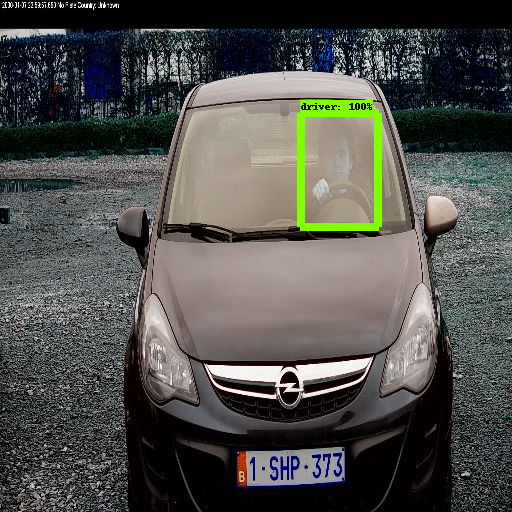

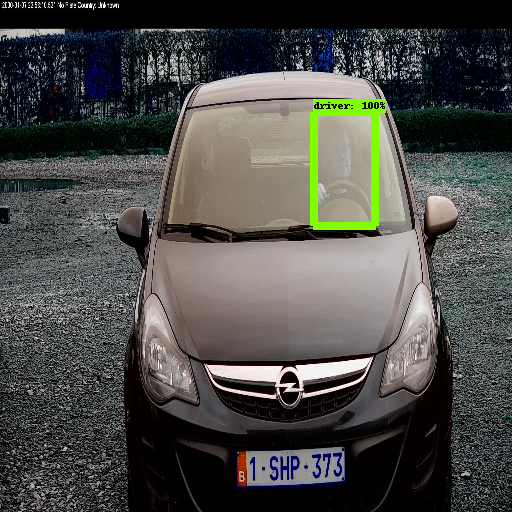

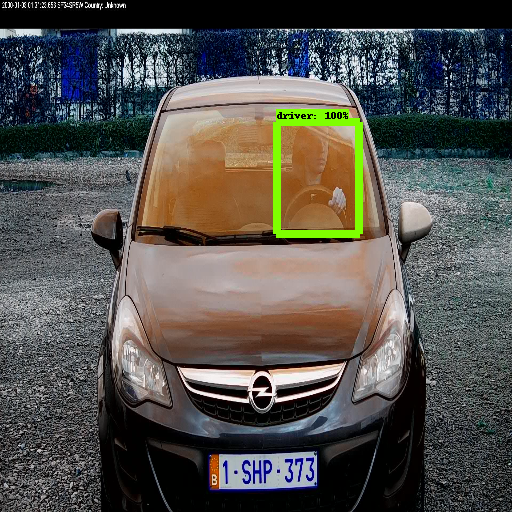

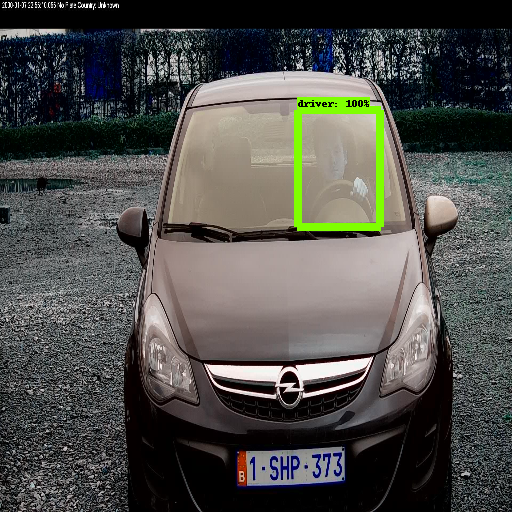

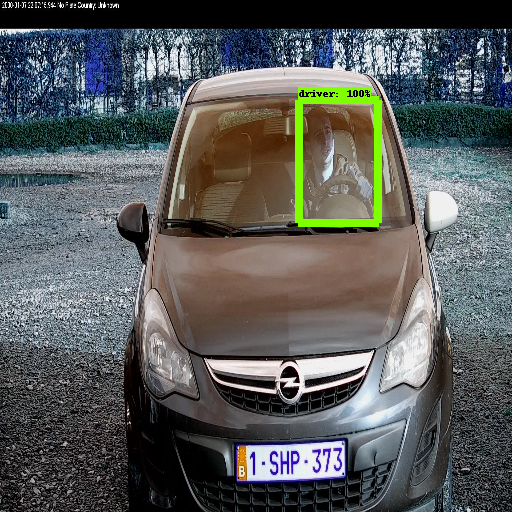

...

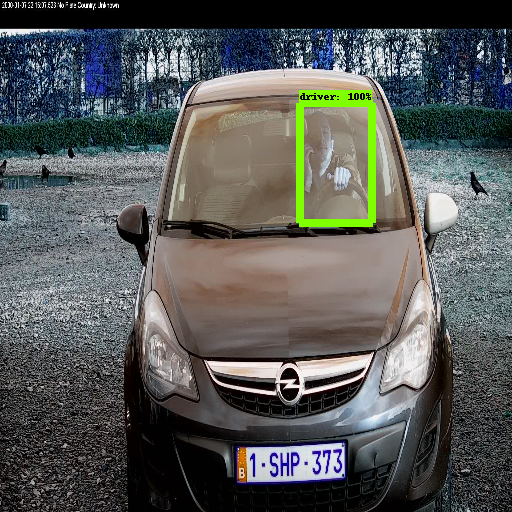

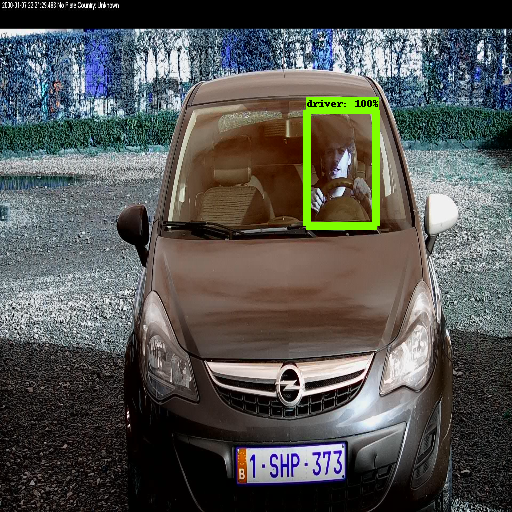

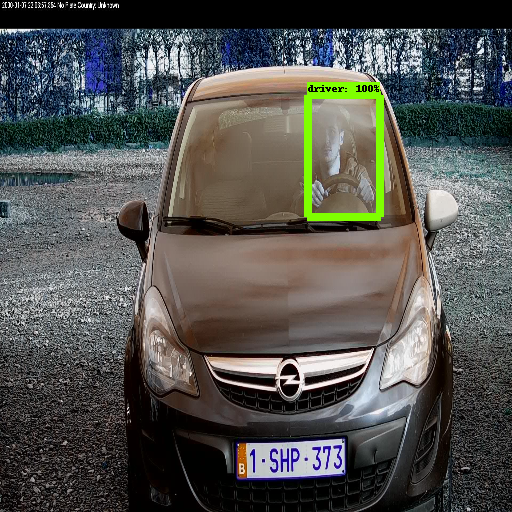

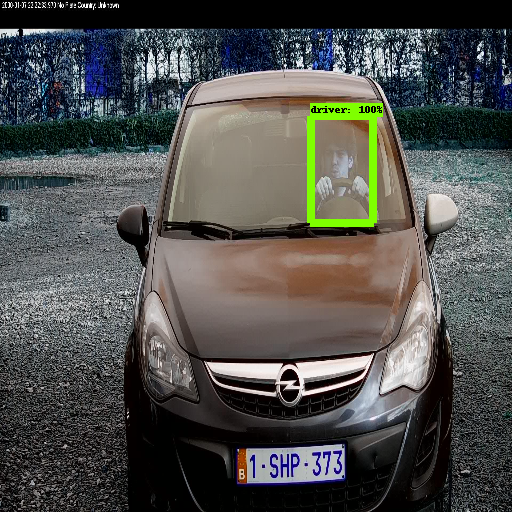

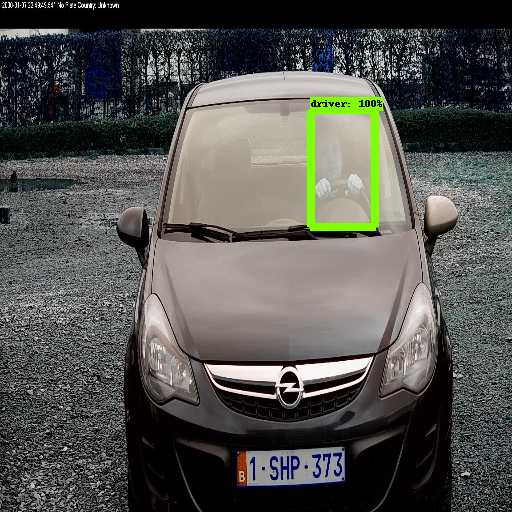

In [15]:
for image_path in glob.glob('/content/gdrive/MyDrive/test-car/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  thresh = max(output_dict['detection_scores']) - 0.0000001
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      min_score_thresh=thresh,
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))